In [1]:
import pandas as pd
import numpy as np
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
from itertools import combinations

data = pd.read_csv(r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_rev.csv')
data.head()

,Mg_C_mol%,Nb_C_mol%,Fe_C_mol%,K_C_mol%,Na_C_mol%,Ce_C_mol%,Rh_C_mol%,Ag_C_mol%,La_C_mol%,Ga_C_mol%,...,Ti_S_mol%,Fe_S_mol%,Zr_S_mol%,Sr_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2)
0,0.0,0.0,0.0,0.0,33.2,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0,1089,2.0,1.0,3.00,18.0
1,0.0,0.0,0.0,0.0,19.5,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1,1073,2.0,1.0,3.00,17.7
2,0.0,0.0,0.0,0.0,8.9,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1,973,4.0,1.0,1.33,25.2
3,0.0,0.0,0.0,0.0,2.1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1,1092,2.1,1.0,0.15,17.8
4,0.0,0.0,0.0,0.0,2.1,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1,1124,2.2,1.0,0.15,18.0


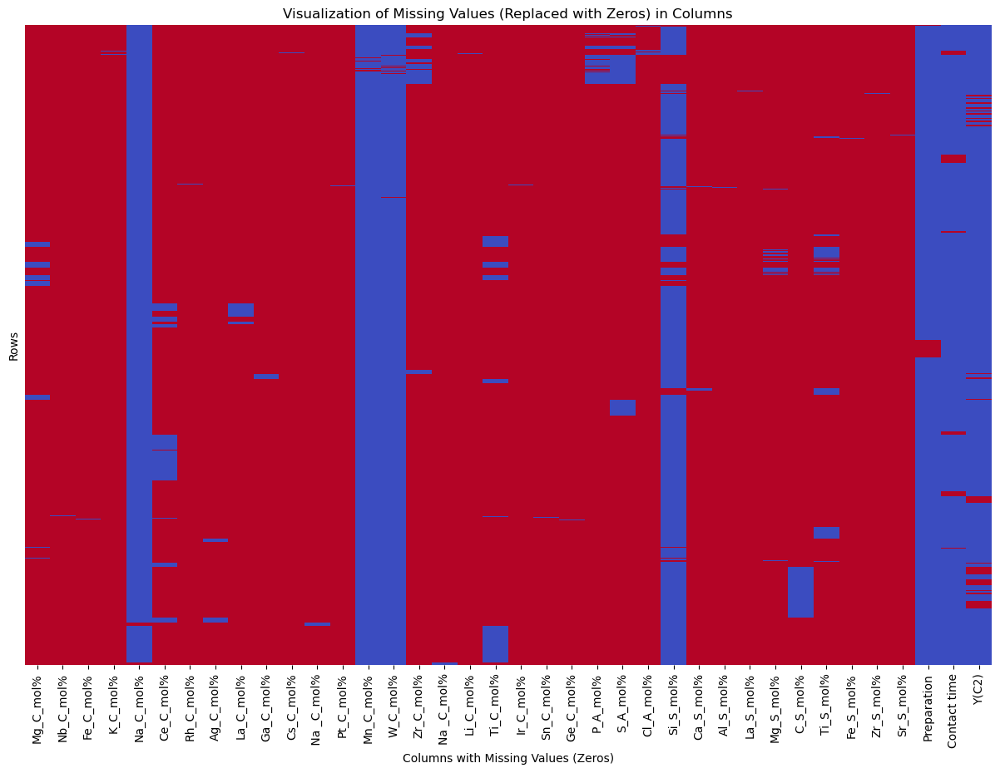

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

missing_value_columns = data.columns[data.eq(0).any()].tolist()

# Creating a DataFrame to visualize the presence of zeros in these columns
visualization_df = data[missing_value_columns].eq(0).astype(int)

plt.figure(figsize=(15, 10))
sns.heatmap(visualization_df, cmap='coolwarm', cbar=False, yticklabels=False)
plt.title("Visualization of Missing Values (Replaced with Zeros) in Columns")
plt.xlabel("Columns with Missing Values (Zeros)")
plt.ylabel("Rows")
plt.show()

In [3]:
non_missing_value_columns = data.columns[~data.eq(0).any()].tolist()

non_missing_value_columns

['Temperature', 'p(CH4)/p(O2)', 'p total']

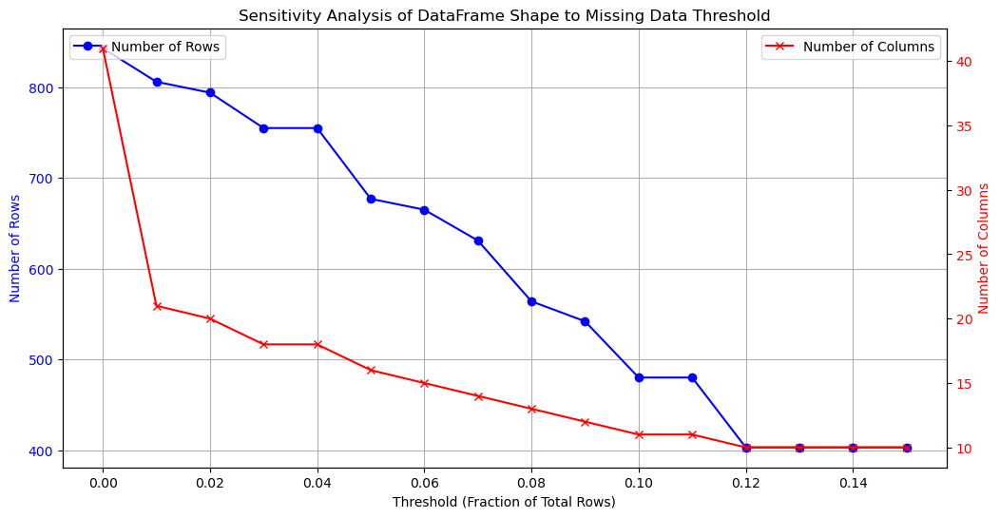

In [4]:
# Calculate the total number of rows in the DataFrame
total_rows = len(data)

# Initialize lists to store results of shape (number of rows, number of columns) for each threshold
thresholds = []
num_rows_list = []
num_columns_list = []

# Perform sensitivity analysis for thresholds from 0% to 15%
for threshold in range(0, 16):
    threshold /= 100  # Convert to fraction
    thresholds.append(threshold)
    
    # Identify columns where non-zero (non-missing) data is less than the given threshold of total rows
    columns_to_remove = []
    rows_to_remove = set()

    for col in data.columns:
        non_zero_count = len(data[data[col] != 0])
        if non_zero_count / total_rows < threshold:
            columns_to_remove.append(col)
            # Collect row indices where data in this column is not missing (not zero)
            rows_to_remove.update(data.index[data[col] != 0].tolist())

    # Remove the identified columns and rows
    temp_df = data.drop(columns=columns_to_remove)
    temp_df.drop(index=list(rows_to_remove), inplace=True)
    
    # Store the shape of the DataFrame after filtering and pruning
    num_rows, num_columns = temp_df.shape
    num_rows_list.append(num_rows)
    num_columns_list.append(num_columns)

# Create a plot with dual y-axes
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot for Number of Rows on the left y-axis
ax1.plot(thresholds, num_rows_list, label='Number of Rows', marker='o', color='b')
ax1.set_xlabel('Threshold (Fraction of Total Rows)')
ax1.set_ylabel('Number of Rows', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(loc='upper left')
ax1.grid(True)

# Create a second y-axis to plot Number of Columns
ax2 = ax1.twinx()
ax2.plot(thresholds, num_columns_list, label='Number of Columns', marker='x', color='r')
ax2.set_ylabel('Number of Columns', color='r')
ax2.tick_params(axis='y', labelcolor='r')
ax2.legend(loc='upper right')

# Title for the plot
plt.title('Sensitivity Analysis of DataFrame Shape to Missing Data Threshold')

plt.show()

In [5]:
# Identify columns where non-zero (non-missing) data is less than 2% of total rows
columns_to_remove = []
rows_to_remove = set()

for col in data.columns:
    if col != 'Promotor':  # Skip the 'Promotor' column
        non_zero_count = len(data[data[col] != 0])
        if non_zero_count / total_rows < 0.02:
            columns_to_remove.append(col)
            # Collect row indices where data in this column is not missing (not zero)
            rows_to_remove.update(data.index[data[col] != 0].tolist())

# Remove the identified columns and rows
filtered_data = data.drop(columns=columns_to_remove)
filtered_data.drop(index=list(rows_to_remove), inplace=True)

filtered_data.shape

(794, 20)

In [6]:
filtered_data.drop_duplicates(inplace=True)

filtered_data

,Mg_C_mol%,Na_C_mol%,Ce_C_mol%,La_C_mol%,Mn_C_mol%,W_C_mol%,Zr_C_mol%,Ti_C_mol%,P_A_mol%,S_A_mol%,Si_S_mol%,Mg_S_mol%,C_S_mol%,Ti_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2)
0,0.0,33.20,0.0,0.0,66.30,0.50,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,1089,2.0,1.0,3.00,18.0
2,0.0,8.90,0.0,0.0,3.50,4.50,0.0,0.00,0.0,0.0,83.10,0.0,0.0,0.0,1,973,4.0,1.0,1.33,25.2
3,0.0,2.10,0.0,0.0,2.25,1.05,0.0,0.00,0.0,0.0,94.60,0.0,0.0,0.0,1,1092,2.1,1.0,0.15,17.8
4,0.0,2.10,0.0,0.0,2.25,1.05,0.0,0.00,0.0,0.0,94.60,0.0,0.0,0.0,1,1124,2.2,1.0,0.15,18.0
5,0.0,2.10,0.0,0.0,2.25,1.05,0.0,0.00,0.0,0.0,94.60,0.0,0.0,0.0,1,1175,2.0,1.0,0.15,23.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
834,0.0,4.39,0.0,0.0,4.90,2.19,0.0,4.84,0.0,0.0,83.68,0.0,0.0,0.0,1,1033,5.0,1.0,0.16,16.4
835,0.0,4.39,0.0,0.0,4.90,2.19,0.0,4.84,0.0,0.0,83.68,0.0,0.0,0.0,1,1013,5.0,1.0,0.16,16.0
836,0.0,4.39,0.0,0.0,4.90,2.19,0.0,4.84,0.0,0.0,83.68,0.0,0.0,0.0,1,993,5.0,1.0,0.16,15.0
837,0.0,4.39,0.0,0.0,4.90,2.19,0.0,4.84,0.0,0.0,83.68,0.0,0.0,0.0,1,973,5.0,1.0,0.16,14.4


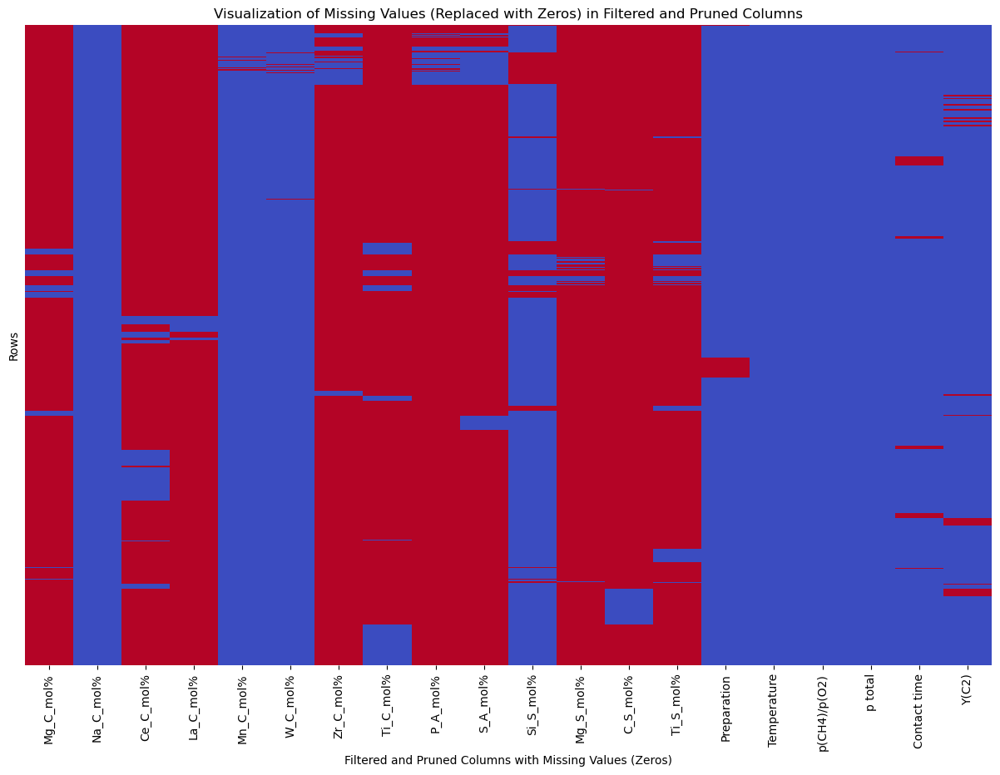

In [7]:
visualization_pruned_df = filtered_data.eq(0).astype(int)

plt.figure(figsize=(15, 10))
sns.heatmap(visualization_pruned_df, cmap='coolwarm', cbar=False, yticklabels=False)
plt.title("Visualization of Missing Values (Replaced with Zeros) in Filtered and Pruned Columns")
plt.xlabel("Filtered and Pruned Columns with Missing Values (Zeros)")
plt.ylabel("Rows")
plt.show()

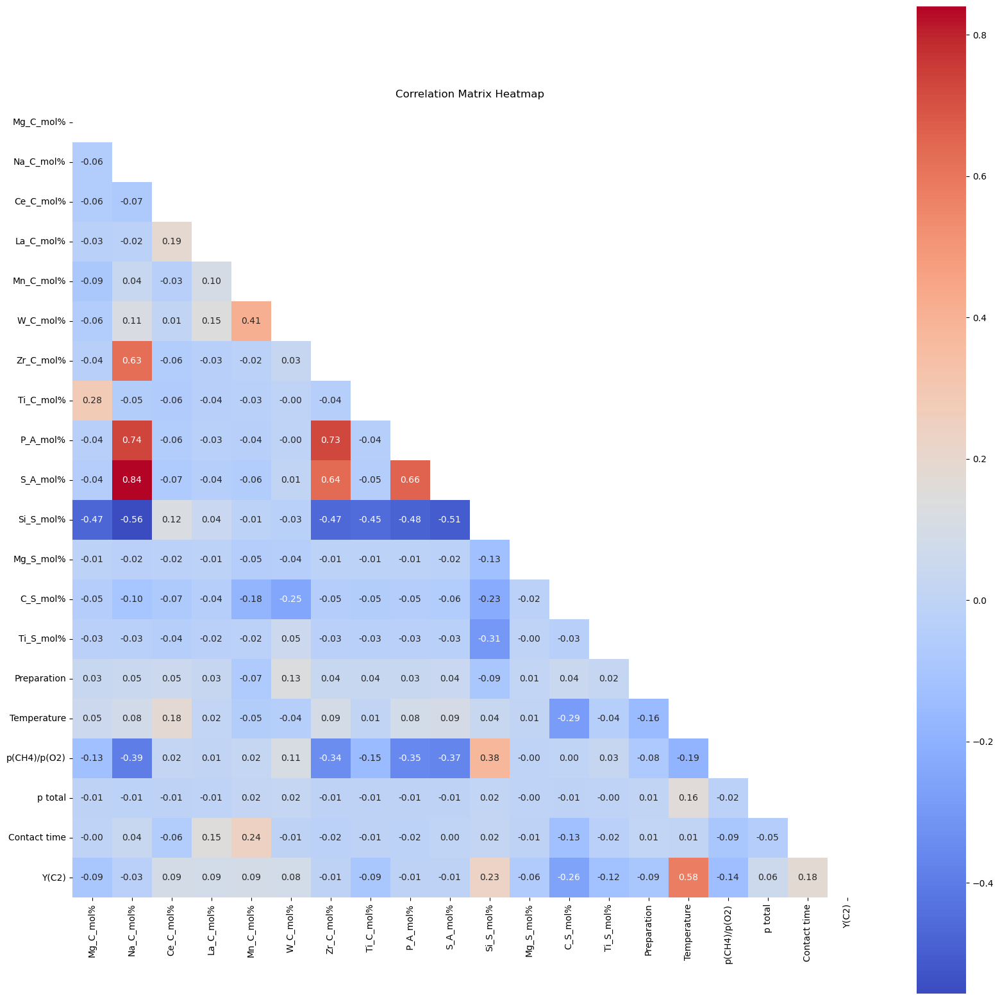

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = filtered_data.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, mask=mask)

# Add title
plt.title('Correlation Matrix Heatmap')

plt.show()

In [9]:
# Find pairs of features with high absolute correlation
threshold = 0.5  # You can change the threshold value as needed
high_correlation_pairs = {}

# Iterate over the correlation matrix to find high correlation pairs
for column in correlation_matrix.columns:
    for index in correlation_matrix.index:
        if index == column:
            continue  # Skip the diagonal elements
        correlation_value = correlation_matrix.loc[index, column]
        if abs(correlation_value) > threshold:
            pair = f"{index} and {column}"
            high_correlation_pairs[pair] = correlation_value

high_correlation_pairs

{'Zr_C_mol% and Na_C_mol%': 0.6271567873225655,
 'P_A_mol% and Na_C_mol%': 0.7355565944839015,
 'S_A_mol% and Na_C_mol%': 0.8400474312429073,
 'Si_S_mol% and Na_C_mol%': -0.5567242229591917,
 'Na_C_mol% and Zr_C_mol%': 0.6271567873225655,
 'P_A_mol% and Zr_C_mol%': 0.7273434399117742,
 'S_A_mol% and Zr_C_mol%': 0.6356555470370413,
 'Na_C_mol% and P_A_mol%': 0.7355565944839015,
 'Zr_C_mol% and P_A_mol%': 0.7273434399117742,
 'S_A_mol% and P_A_mol%': 0.658363170167202,
 'Na_C_mol% and S_A_mol%': 0.8400474312429073,
 'Zr_C_mol% and S_A_mol%': 0.6356555470370413,
 'P_A_mol% and S_A_mol%': 0.658363170167202,
 'Si_S_mol% and S_A_mol%': -0.5070050211306163,
 'Na_C_mol% and Si_S_mol%': -0.5567242229591917,
 'S_A_mol% and Si_S_mol%': -0.5070050211306163,
 'Y(C2) and Temperature': 0.578987608255676,
 'Temperature and Y(C2)': 0.578987608255676}

        Mg_C_mol%   Na_C_mol%   Ce_C_mol%   La_C_mol%   Mn_C_mol%    W_C_mol%  \
count  756.000000  756.000000  756.000000  756.000000  756.000000  756.000000   
mean     2.485238    6.081349    0.240992    0.065079    3.611601    1.368704   
std     13.236149   13.067995    0.815433    0.385311    3.807522    0.979066   
min      0.000000    0.010000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    2.080000    0.000000    0.000000    2.100000    1.020000   
50%      0.000000    2.170000    0.000000    0.000000    2.250000    1.050000   
75%      0.000000    4.345000    0.000000    0.000000    4.480000    1.660000   
max     96.400000   86.890000    4.690000    2.378979   66.300000   10.260000   

        Zr_C_mol%   Ti_C_mol%    P_A_mol%    S_A_mol%   Si_S_mol%   Mg_S_mol%  \
count  756.000000  756.000000  756.000000  756.000000  756.000000  756.000000   
mean     1.015516    2.551204    0.287923    0.594974   77.025397    0.359458   
std      5.166251   12.1682

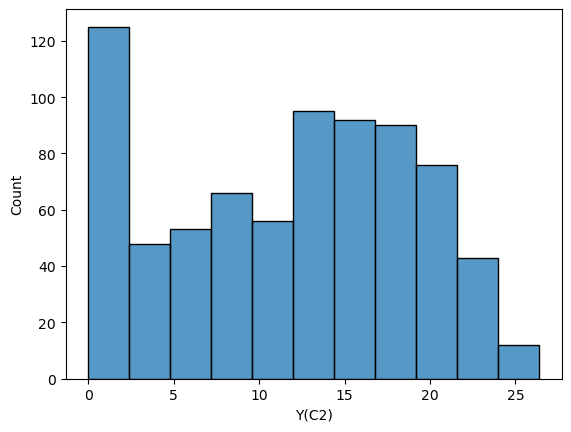

In [10]:
# 기초 통계량 확인
print(filtered_data.describe())

# 결측치 확인
print(filtered_data.isnull().sum())

# 히스토그램
sns.histplot(filtered_data['Y(C2)'])
plt.show()

In [11]:
filtered_data.to_csv(r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_revison.csv', index=False)

In [12]:
# Define a function to check if 'Na_C_mol%', 'W_C_mol%', and 'Mn_C_mol%' are the same within an error of 0.03
def similar_elements(row1, row2, error=0.03):
    return all(abs(row1[element] - row2[element]) <= error for element in ['Na_C_mol%', 'W_C_mol%', 'Mn_C_mol%'])

# Create an empty DataFrame to store the similar rows
similar_rows = pd.DataFrame()

# Iterate over each combination of rows to find similar ones based on the condition
for i in range(len(filtered_data)):
    for j in range(i+1, len(filtered_data)):
        if similar_elements(filtered_data.iloc[i], filtered_data.iloc[j]):
            # Add the rows to the similar_rows DataFrame if they are similar
            similar_rows = similar_rows.append(filtered_data.iloc[i])
            similar_rows = similar_rows.append(filtered_data.iloc[j])

# Drop duplicate rows that might have been added more than once
similar_rows.drop_duplicates(inplace=True)

# Display the first few rows of the similar rows DataFrame
similar_rows.head()

C:\Users\OJH\AppData\Local\Temp\ipykernel_34740\45652196.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  similar_rows = similar_rows.append(filtered_data.iloc[i])
C:\Users\OJH\AppData\Local\Temp\ipykernel_34740\45652196.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  similar_rows = similar_rows.append(filtered_data.iloc[j])
C:\Users\OJH\AppData\Local\Temp\ipykernel_34740\45652196.py:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  similar_rows = similar_rows.append(filtered_data.iloc[i])
C:\Users\OJH\AppData\Local\Temp\ipykernel_34740\45652196.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  similar_rows = similar_rows.ap

,Mg_C_mol%,Na_C_mol%,Ce_C_mol%,La_C_mol%,Mn_C_mol%,W_C_mol%,Zr_C_mol%,Ti_C_mol%,P_A_mol%,S_A_mol%,Si_S_mol%,Mg_S_mol%,C_S_mol%,Ti_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2)
2,0.0,8.9,0.0,0.0,3.5,4.5,0.0,0.0,0.0,0.0,83.1,0.0,0.0,0.0,1.0,973.0,4.0,1.0,1.33,25.2
16,0.0,8.9,0.0,0.0,3.5,4.5,0.0,0.0,0.0,0.0,83.1,0.0,0.0,0.0,1.0,1093.0,4.0,1.0,0.12,15.5
78,0.0,8.9,0.0,0.0,3.5,4.5,0.0,0.0,0.0,0.0,83.1,0.0,0.0,0.0,1.0,1023.0,8.1,1.0,0.04,10.8
79,0.0,8.9,0.0,0.0,3.5,4.5,0.0,0.0,0.0,0.0,83.1,0.0,0.0,0.0,1.0,1073.0,3.2,1.0,0.14,19.6
80,0.0,8.9,0.0,0.0,3.5,4.5,0.0,0.0,0.0,0.0,83.1,0.0,0.0,0.0,1.0,1073.0,2.5,1.0,0.11,19.2


In [13]:
similar_rows.shape

(626, 20)

In [14]:
similar_rows.columns

Index(['Mg_C_mol%', 'Na_C_mol%', 'Ce_C_mol%', 'La_C_mol%', 'Mn_C_mol%',
       'W_C_mol%', 'Zr_C_mol%', 'Ti_C_mol%', 'P_A_mol%', 'S_A_mol%',
       'Si_S_mol%', 'Mg_S_mol%', 'C_S_mol%', 'Ti_S_mol%', 'Preparation',
       'Temperature', 'p(CH4)/p(O2)', 'p total', 'Contact time', 'Y(C2)'],
      dtype='object')

In [15]:
similar_rows.to_csv(r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_condition.csv', index=False)

In [16]:
latest_data_path = r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_condition.csv'

latest_data = pd.read_csv(latest_data_path)

# List of columns to check for existence of values
value_columns = ['Na_C_mol%', 'W_C_mol%', 'Mn_C_mol%', 'Si_S_mol%', 'Preparation', 'Temperature', 'p(CH4)/p(O2)', 'p total', 'Contact time', 'Y(C2)']
exclude_columns = ['Mg_C_mol%', 'Ce_C_mol%', 'La_C_mol%', 'Zr_C_mol%', 'Ti_C_mol%', 'Mg_S_mol%', 'C_S_mol%', 'Ti_S_mol%', 'P_A_mol%', 'S_A_mol%']

for col in exclude_columns:
    latest_data[col] = latest_data[col].apply(lambda x: pd.NA if x == 0 else x)

# Filter the data with the updated criteria
filtered_data = latest_data[
    # Include rows where all value_columns have values (ignoring 0)
    latest_data[value_columns].notnull().all(axis=1) &
    # Exclude rows where any exclude_columns have non-zero values
    latest_data[exclude_columns].isnull().all(axis=1)
]

# Display the first few rows of the filtered DataFrame to verify changes
filtered_data.head()

,Mg_C_mol%,Na_C_mol%,Ce_C_mol%,La_C_mol%,Mn_C_mol%,W_C_mol%,Zr_C_mol%,Ti_C_mol%,P_A_mol%,S_A_mol%,Si_S_mol%,Mg_S_mol%,C_S_mol%,Ti_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2)
0,<NA>,8.9,<NA>,<NA>,3.5,4.5,<NA>,<NA>,<NA>,<NA>,83.1,<NA>,<NA>,<NA>,1.0,973.0,4.0,1.0,1.33,25.2
1,<NA>,8.9,<NA>,<NA>,3.5,4.5,<NA>,<NA>,<NA>,<NA>,83.1,<NA>,<NA>,<NA>,1.0,1093.0,4.0,1.0,0.12,15.5
2,<NA>,8.9,<NA>,<NA>,3.5,4.5,<NA>,<NA>,<NA>,<NA>,83.1,<NA>,<NA>,<NA>,1.0,1023.0,8.1,1.0,0.04,10.8
3,<NA>,8.9,<NA>,<NA>,3.5,4.5,<NA>,<NA>,<NA>,<NA>,83.1,<NA>,<NA>,<NA>,1.0,1073.0,3.2,1.0,0.14,19.6
4,<NA>,8.9,<NA>,<NA>,3.5,4.5,<NA>,<NA>,<NA>,<NA>,83.1,<NA>,<NA>,<NA>,1.0,1073.0,2.5,1.0,0.11,19.2


In [17]:
filtered_data.drop(['Mg_C_mol%', 'Ce_C_mol%', 'La_C_mol%', 'Zr_C_mol%', 'Ti_C_mol%', 'Mg_S_mol%', 'C_S_mol%', 'Ti_S_mol%', 'P_A_mol%', 'S_A_mol%'], axis=1, inplace=True)

C:\Users\OJH\AppData\Local\Temp\ipykernel_34740\4132629015.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.drop(['Mg_C_mol%', 'Ce_C_mol%', 'La_C_mol%', 'Zr_C_mol%', 'Ti_C_mol%', 'Mg_S_mol%', 'C_S_mol%', 'Ti_S_mol%', 'P_A_mol%', 'S_A_mol%'], axis=1, inplace=True)


In [18]:
filtered_data

,Na_C_mol%,Mn_C_mol%,W_C_mol%,Si_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2)
0,8.9,3.50,4.50,83.1,1.0,973.0,4.0,1.0,1.33,25.2
1,8.9,3.50,4.50,83.1,1.0,1093.0,4.0,1.0,0.12,15.5
2,8.9,3.50,4.50,83.1,1.0,1023.0,8.1,1.0,0.04,10.8
3,8.9,3.50,4.50,83.1,1.0,1073.0,3.2,1.0,0.14,19.6
4,8.9,3.50,4.50,83.1,1.0,1073.0,2.5,1.0,0.11,19.2
...,...,...,...,...,...,...,...,...,...,...
551,2.1,1.56,1.05,95.3,1.0,1073.0,9.0,1.0,0.01,8.5
552,2.1,1.56,1.05,95.3,1.0,1073.0,12.0,1.0,0.01,8.3
553,2.1,1.56,1.05,95.3,1.0,1073.0,15.0,1.0,0.01,6.5
554,2.1,1.56,1.05,95.3,1.0,1073.0,18.0,1.0,0.01,5.6


In [19]:
filtered_data['Preparation'] = filtered_data['Preparation'].astype('category')

C:\Users\OJH\AppData\Local\Temp\ipykernel_34740\3459334477.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Preparation'] = filtered_data['Preparation'].astype('category')


In [20]:
filtered_data

,Na_C_mol%,Mn_C_mol%,W_C_mol%,Si_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2)
0,8.9,3.50,4.50,83.1,1.0,973.0,4.0,1.0,1.33,25.2
1,8.9,3.50,4.50,83.1,1.0,1093.0,4.0,1.0,0.12,15.5
2,8.9,3.50,4.50,83.1,1.0,1023.0,8.1,1.0,0.04,10.8
3,8.9,3.50,4.50,83.1,1.0,1073.0,3.2,1.0,0.14,19.6
4,8.9,3.50,4.50,83.1,1.0,1073.0,2.5,1.0,0.11,19.2
...,...,...,...,...,...,...,...,...,...,...
551,2.1,1.56,1.05,95.3,1.0,1073.0,9.0,1.0,0.01,8.5
552,2.1,1.56,1.05,95.3,1.0,1073.0,12.0,1.0,0.01,8.3
553,2.1,1.56,1.05,95.3,1.0,1073.0,15.0,1.0,0.01,6.5
554,2.1,1.56,1.05,95.3,1.0,1073.0,18.0,1.0,0.01,5.6


In [21]:
filtered_data.to_csv(r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_operation.csv', index=False)

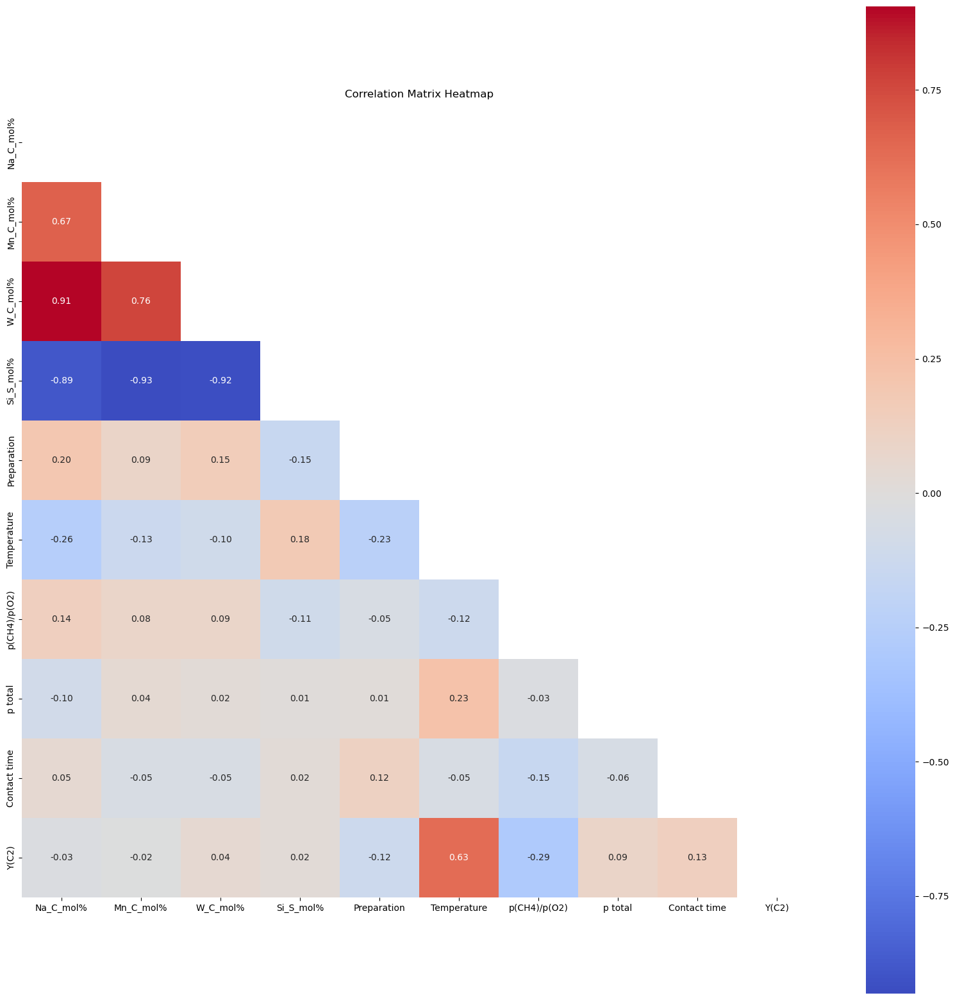

(322, 10)


In [22]:
operation_data = pd.read_csv(r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_operation.csv')

correlation_matrix = operation_data.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, mask=mask)

# Add title
plt.title('Correlation Matrix Heatmap')

plt.show()
print(operation_data.shape)

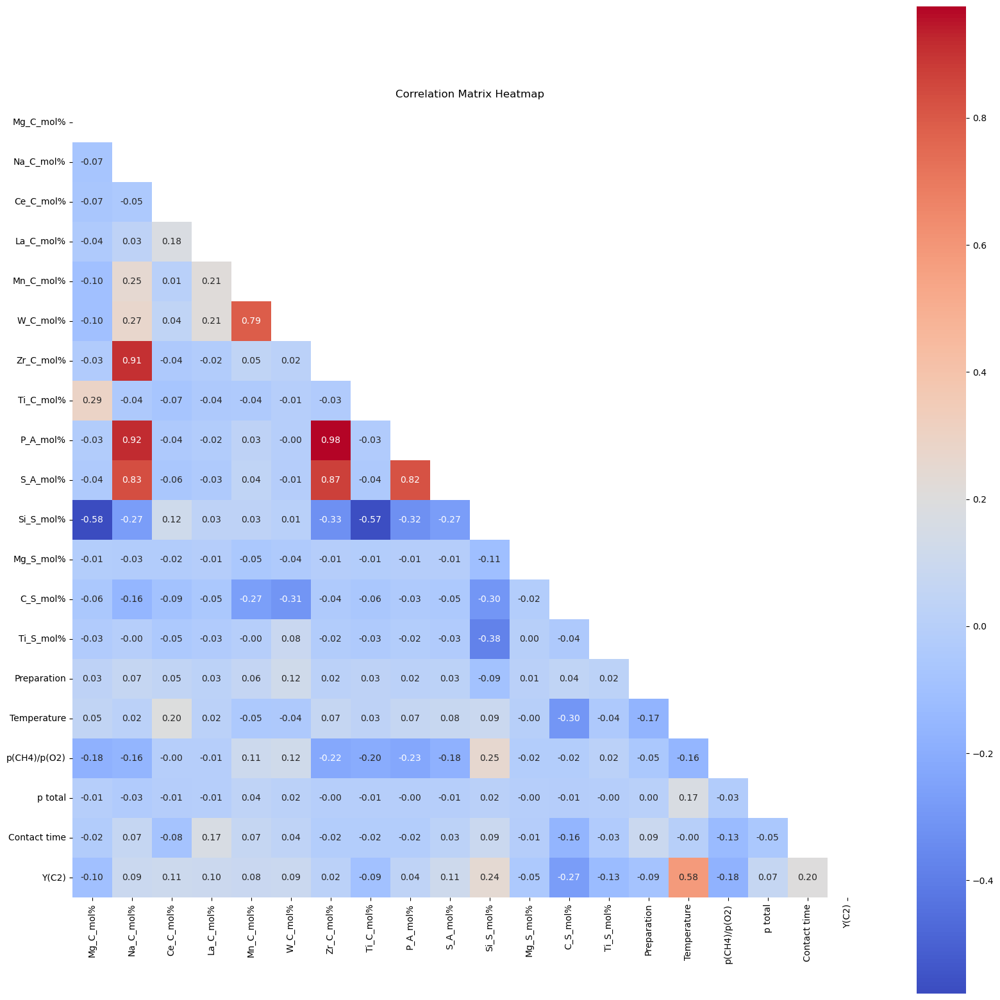

(626, 20)


In [23]:
latest_data_path = r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_condition.csv'

latest_data = pd.read_csv(latest_data_path)

correlation_matrix = latest_data.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(20, 20))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, mask=mask)

# Add title
plt.title('Correlation Matrix Heatmap')

plt.show()
print(latest_data.shape)

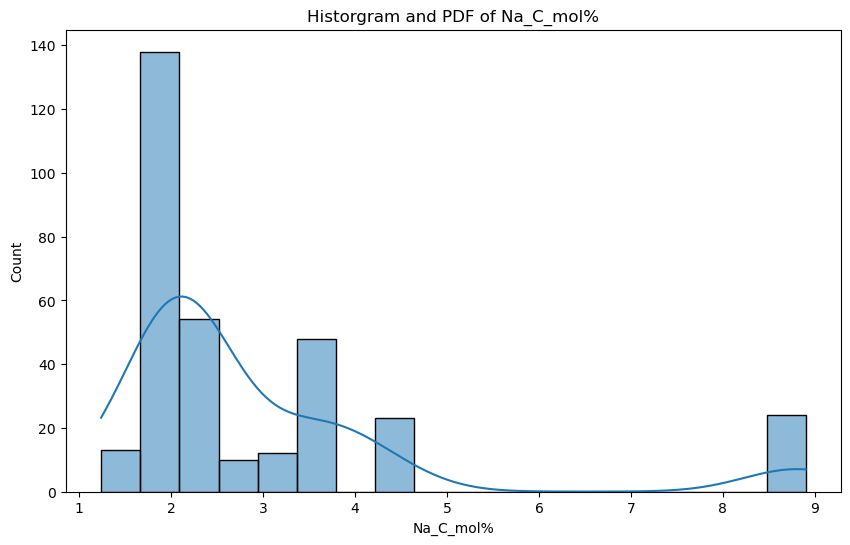

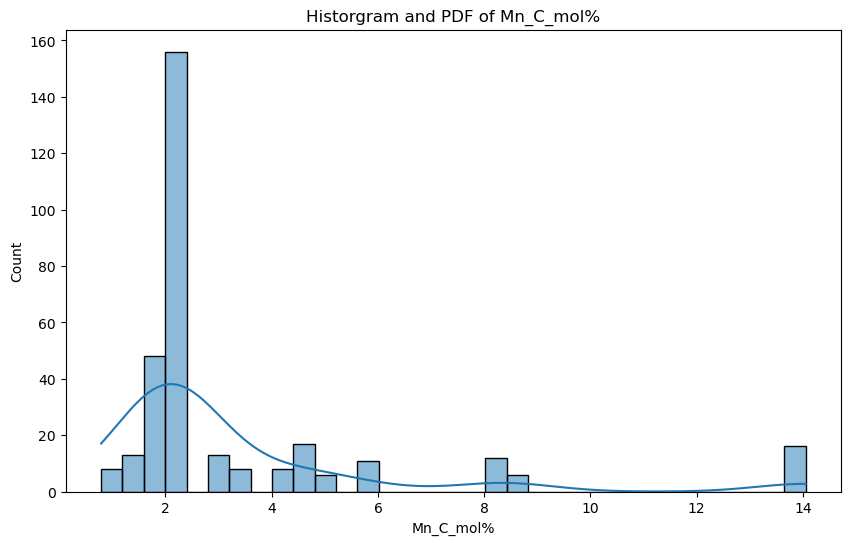

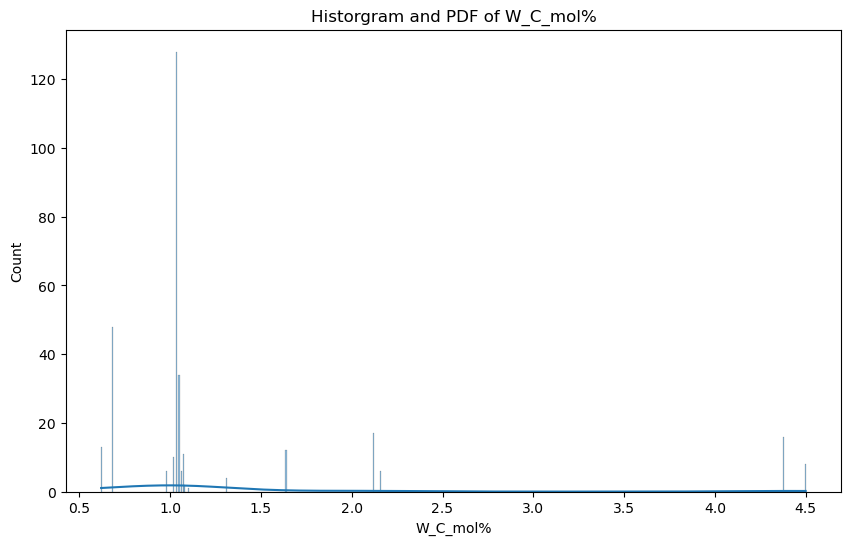

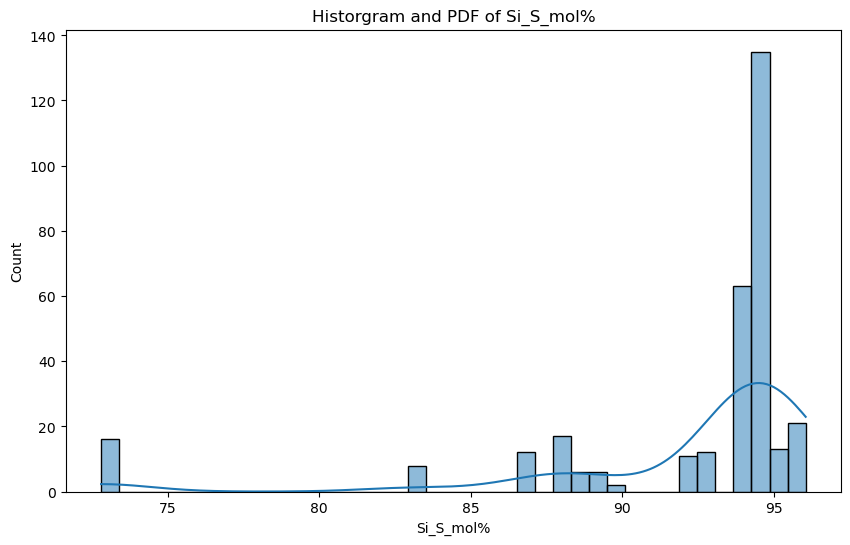

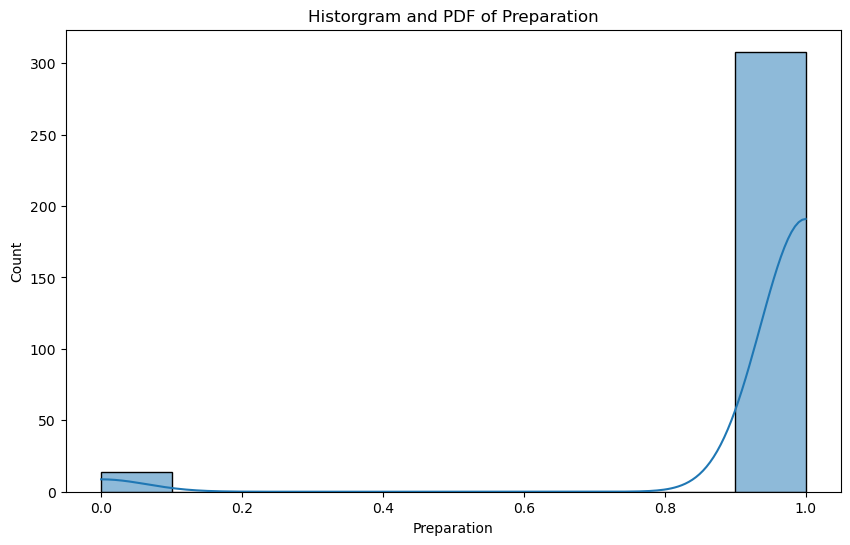

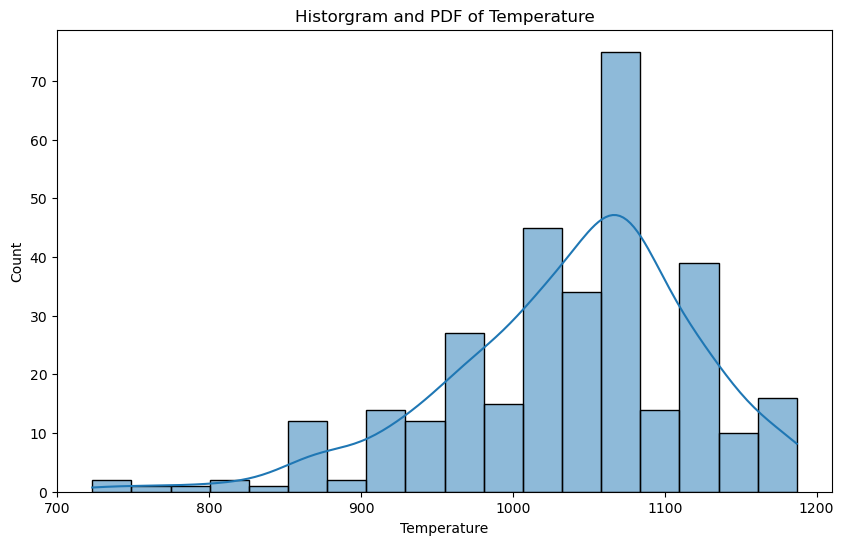

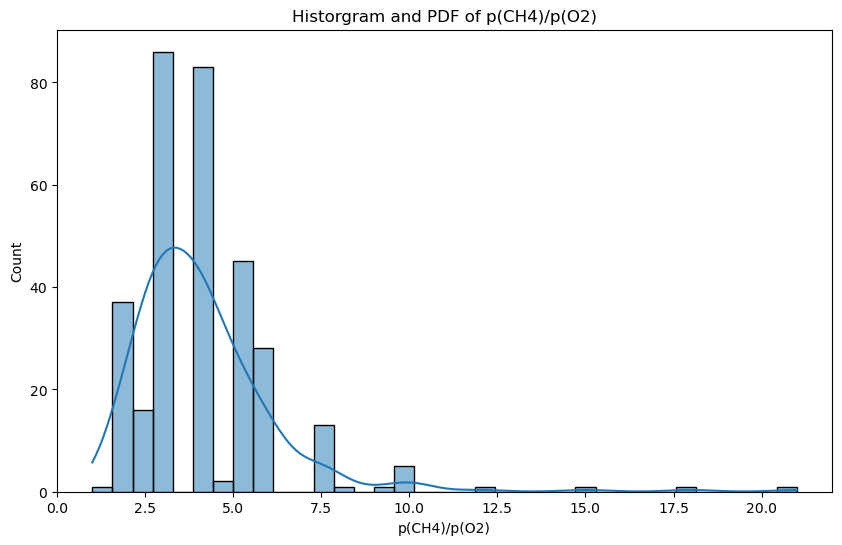

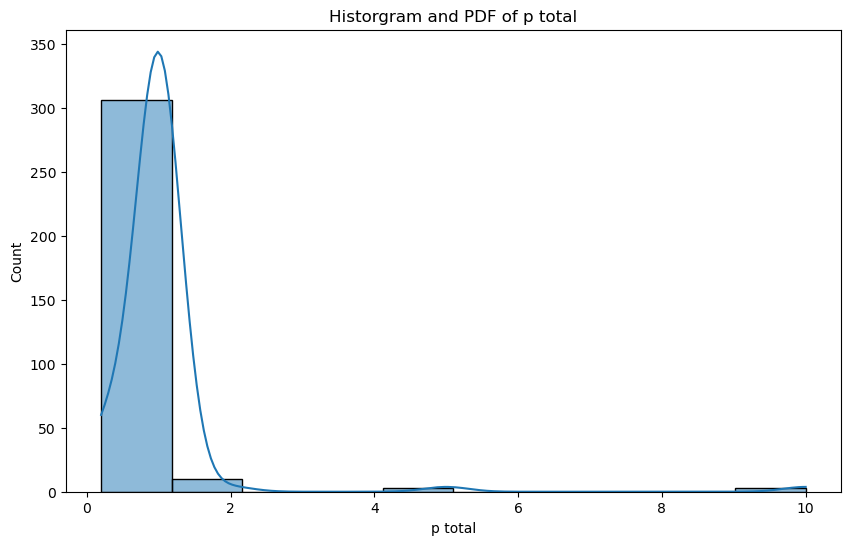

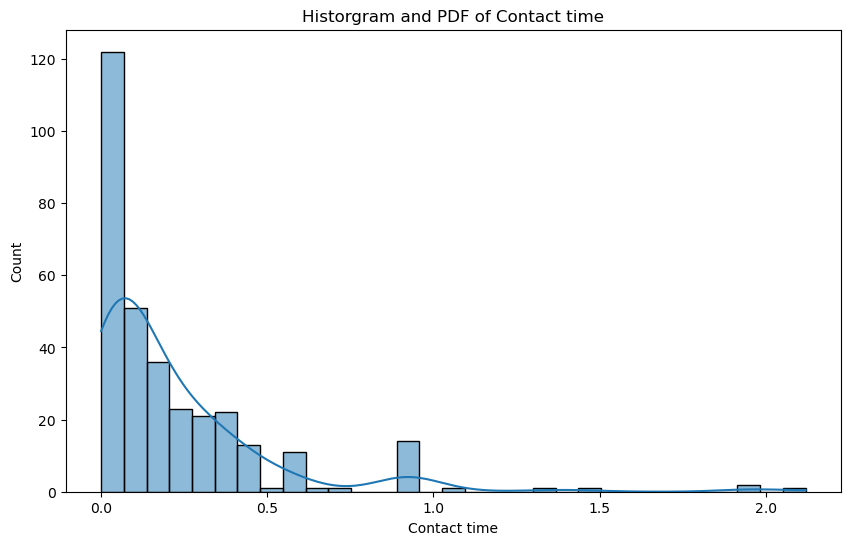

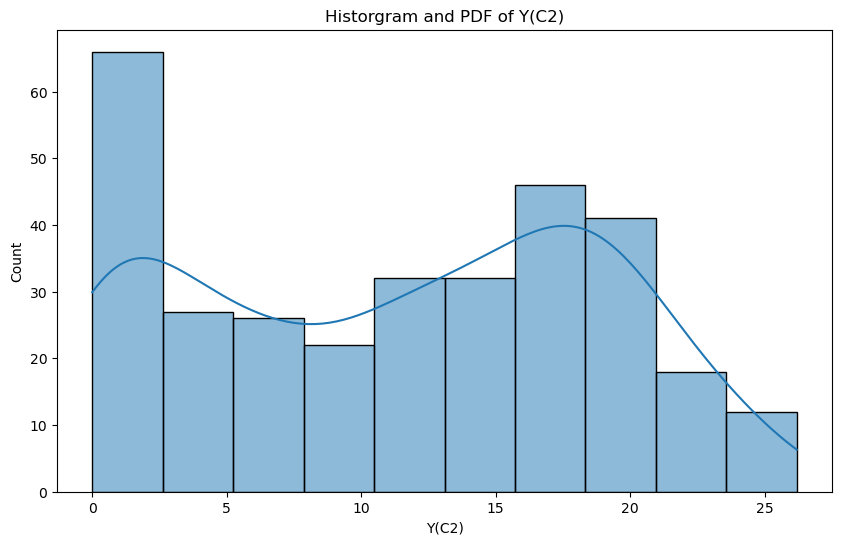

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt

for column in operation_data.columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(operation_data[column], kde=True)
    plt.title(f'Historgram and PDF of {column}')
    plt.show()

In [25]:
skewness = operation_data.skew()
kurtosis = operation_data.kurtosis()

print(f"skewness:\n{skewness}\n")
print(f"kurtosis:\n{kurtosis}")

skewness:
Na_C_mol%       2.366502
Mn_C_mol%       2.516323
W_C_mol%        2.582647
Si_S_mol%      -2.655793
Preparation    -4.498197
Temperature    -0.778110
p(CH4)/p(O2)    3.294643
p total         7.538580
Contact time    3.115644
Y(C2)          -0.065697
dtype: float64

kurtosis:
Na_C_mol%        4.970309
Mn_C_mol%        5.929298
W_C_mol%         5.723406
Si_S_mol%        6.777128
Preparation     18.347697
Temperature      0.995755
p(CH4)/p(O2)    18.538401
p total         63.502118
Contact time    13.145825
Y(C2)           -1.298045
dtype: float64


In [26]:
# Rounding off the composition columns to group similar compositions
operation_data['group'] = (operation_data['Na_C_mol%'].round(-1).astype(str) + '_' +
                           operation_data['Mn_C_mol%'].round(-1).astype(str) + '_' +
                           operation_data['W_C_mol%'].round(-1).astype(str) + '_' +
                           operation_data['Si_S_mol%'].round(-1).astype(str))

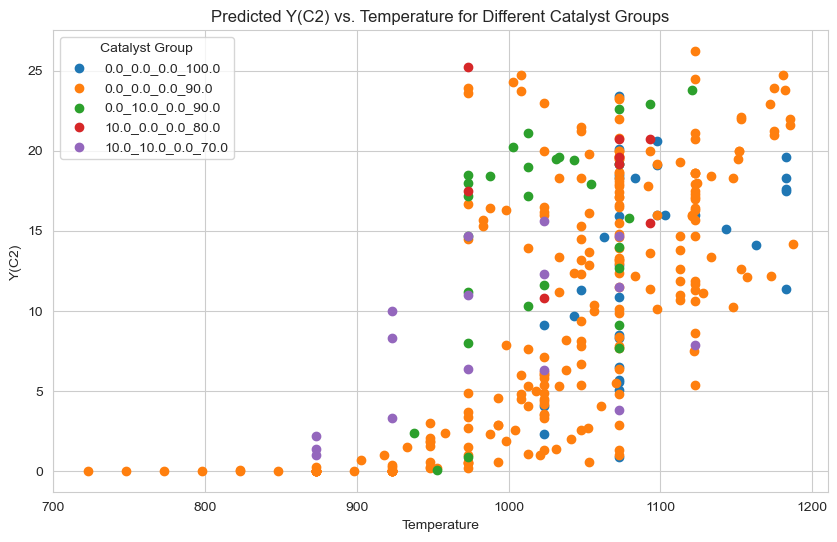

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a scatter plot for each group
plt.figure(figsize=(10, 6))
for name, group in operation_data.groupby('group'):
    plt.scatter(group['Temperature'], group['Y(C2)'], label=name)

plt.xlabel('Temperature')
plt.ylabel('Y(C2)')
plt.title('Predicted Y(C2) vs. Temperature for Different Catalyst Groups')
plt.legend(title='Catalyst Group')
plt.show()

In [28]:
def in_same_group(row1, row2, error=0.05):
    return all(abs(row1[col] - row2[col]) <= error for col in ['Na_C_mol%', 'Mn_C_mol%', 'W_C_mol%', 'Si_S_mol%'])

# Apply grouping logic (This is a naive approach for illustration and might be slow for large datasets)
groups = []
for i, row_i in operation_data.iterrows():
    found_group = False
    for group in groups:
        if in_same_group(row_i, operation_data.loc[group[0]], error=0.05):
            group.append(i)
            found_group = True
            break
    if not found_group:
        groups.append([i])

# Assign group ID to each row
for idx, group in enumerate(groups):
    for row_idx in group:
        operation_data.at[row_idx, 'group'] = idx

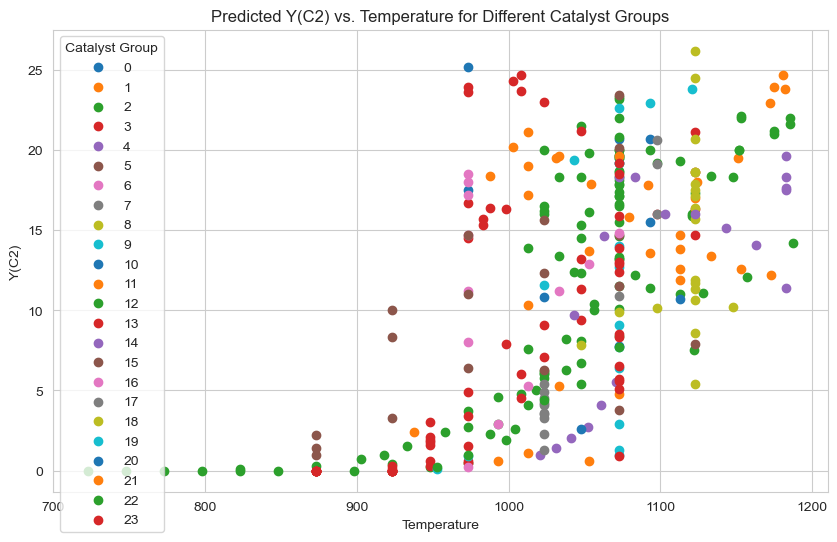

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a scatter plot for each group
plt.figure(figsize=(10, 6))
for name, group in operation_data.groupby('group'):
    plt.scatter(group['Temperature'], group['Y(C2)'], label=name)

plt.xlabel('Temperature')
plt.ylabel('Y(C2)')
plt.title('Predicted Y(C2) vs. Temperature for Different Catalyst Groups')
plt.legend(title='Catalyst Group')
plt.show()

In [30]:
operation_data['group']

0       0
1       0
2       0
3       0
4       0
       ..
317    23
318    23
319    23
320    23
321    23
Name: group, Length: 322, dtype: object

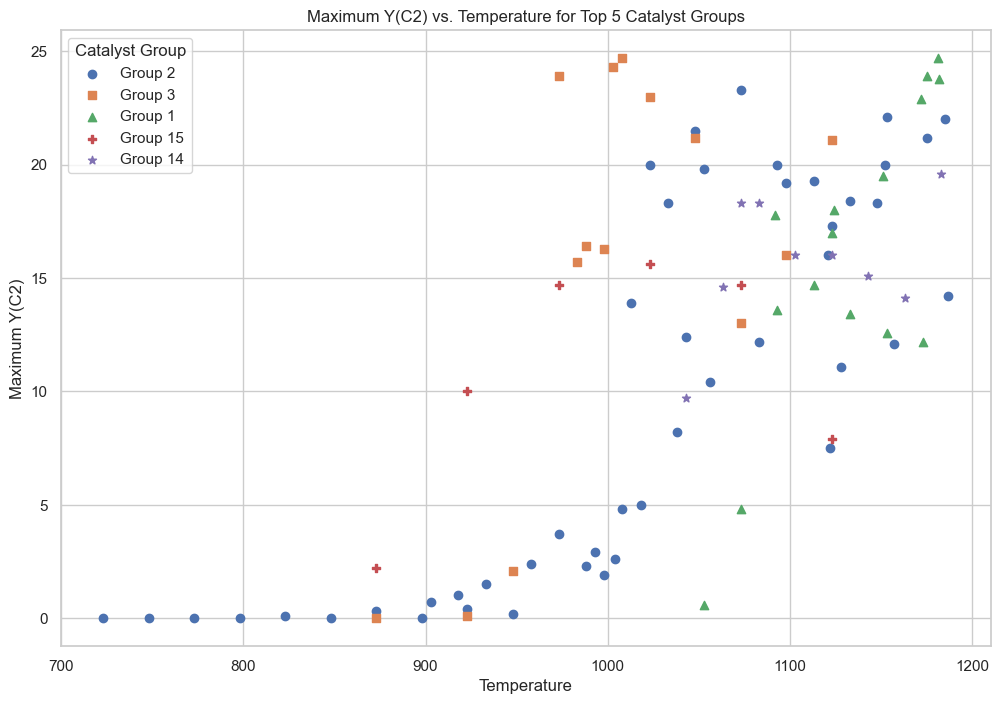

In [31]:
# Assuming the 'group' column already exists or is created based on the similarity
grouped = operation_data.groupby('group')

# Find the top 5 groups with the largest number of data points
top_5_groups = grouped.size().nlargest(5).index

# Step 3: Determine Maximum 'Y(C2)' Values
max_y_c2_per_temp = operation_data[operation_data['group'].isin(top_5_groups)].groupby(['group', 'Temperature'])['Y(C2)'].max().reset_index()

# Step 4: Visualization
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Plotting each group with a different color and marker
markers = ['o', 's', '^', 'P', '*']  # Just as an example, use different markers for each group
for (group, marker) in zip(top_5_groups, markers):
    # Filter data for the group
    group_data = max_y_c2_per_temp[max_y_c2_per_temp['group'] == group]
    plt.scatter(group_data['Temperature'], group_data['Y(C2)'], marker=marker, label=f'Group {group}')

plt.title('Maximum Y(C2) vs. Temperature for Top 5 Catalyst Groups')
plt.xlabel('Temperature')
plt.ylabel('Maximum Y(C2)')
plt.legend(title='Catalyst Group')
plt.show()

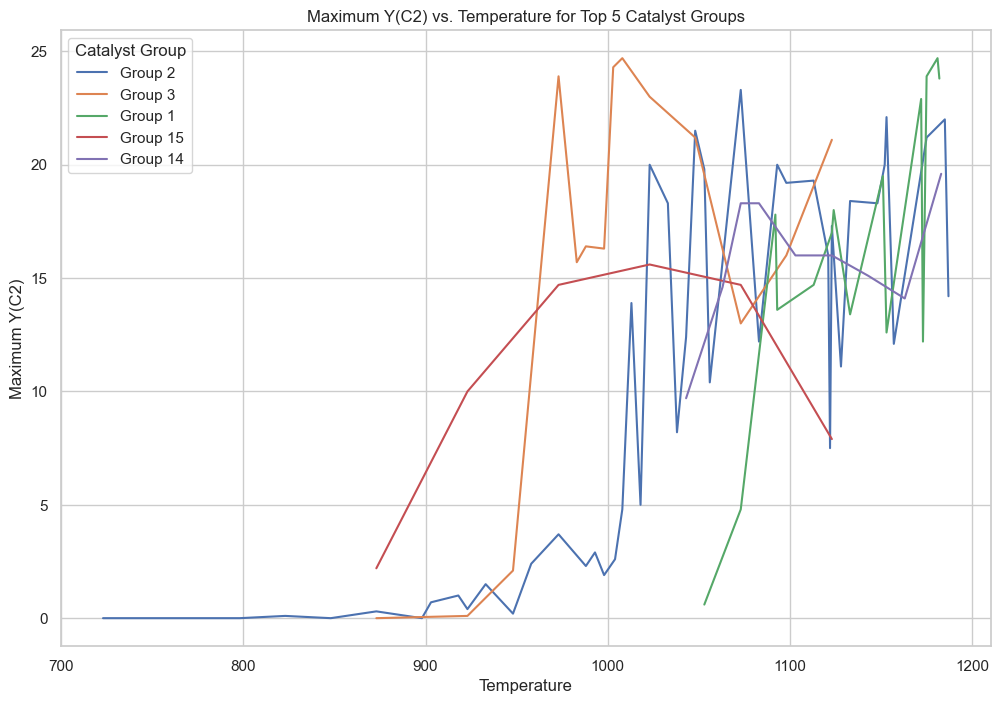

In [32]:
# Step 2: Group and Filter Data
grouped = operation_data.groupby('group')
top_5_groups = grouped.size().nlargest(5).index

# Step 3: Determine Maximum 'Y(C2)' Values
max_y_c2_per_temp = operation_data[operation_data['group'].isin(top_5_groups)].groupby(['group', 'Temperature'])['Y(C2)'].max().reset_index()

# Step 4: Visualization
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Plotting each group with a different color and style
for group in top_5_groups:
    group_data = max_y_c2_per_temp[max_y_c2_per_temp['group'] == group]
    plt.plot(group_data['Temperature'], group_data['Y(C2)'], label=f'Group {group}')

plt.title('Maximum Y(C2) vs. Temperature for Top 5 Catalyst Groups')
plt.xlabel('Temperature')
plt.ylabel('Maximum Y(C2)')
plt.legend(title='Catalyst Group')
plt.show()

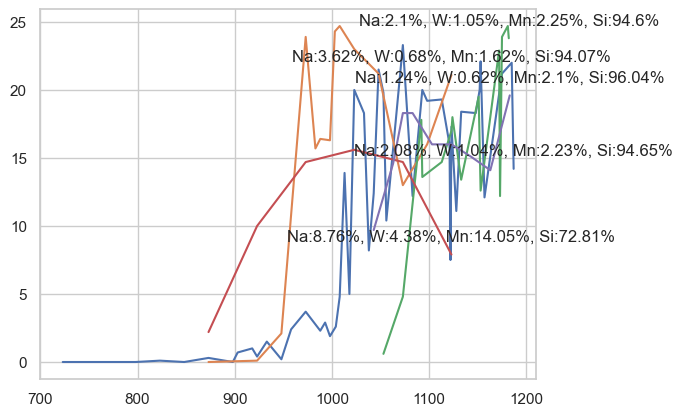

In [33]:
for group in top_5_groups:
    group_data = max_y_c2_per_temp[max_y_c2_per_temp['group'] == group]
    plt.plot(group_data['Temperature'], group_data['Y(C2)'], label=f'Group {group}')

    # Annotate composition at the last data point of each group
    comp_data = operation_data[operation_data['group'] == group].iloc[0]
    comp_details = f"Na:{comp_data['Na_C_mol%']}%, W:{comp_data['W_C_mol%']}%, Mn:{comp_data['Mn_C_mol%']}%, Si:{comp_data['Si_S_mol%']}%"
    plt.annotate(comp_details, (group_data['Temperature'].iloc[-1], group_data['Y(C2)'].iloc[-1]),
                 textcoords="offset points", xytext=(0,10), ha='center')

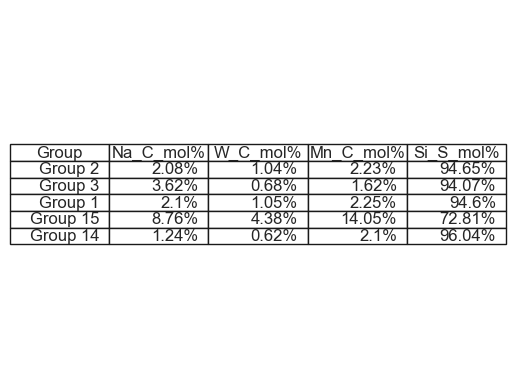

In [34]:
fig, ax = plt.subplots()
ax.axis('tight')
ax.axis('off')
comp_data = []

for group in top_5_groups:
    # Get one example row for each group
    example_row = operation_data[operation_data['group'] == group].iloc[0]
    comp_data.append([f"Group {group}",
                      f"{example_row['Na_C_mol%']}%",
                      f"{example_row['W_C_mol%']}%",
                      f"{example_row['Mn_C_mol%']}%",
                      f"{example_row['Si_S_mol%']}%"])

comp_table = ax.table(cellText=comp_data, colLabels=["Group", "Na_C_mol%", "W_C_mol%", "Mn_C_mol%", "Si_S_mol%"], loc='center')
comp_table.auto_set_font_size(False)
comp_table.set_fontsize(12)

plt.show()

In [35]:
import plotly.graph_objects as go

fig = go.Figure()

for group in top_5_groups:
    group_data = max_y_c2_per_temp[max_y_c2_per_temp['group'] == group]
    comp_data = operation_data[operation_data['group'] == group].iloc[0]
    comp_details = f"Na:{comp_data['Na_C_mol%']}%, W:{comp_data['W_C_mol%']}%, Mn:{comp_data['Mn_C_mol%']}%, Si:{comp_data['Si_S_mol%']}%"
    
    fig.add_trace(go.Scatter(x=group_data['Temperature'], y=group_data['Y(C2)'],
                             mode='lines+markers',
                             name=f'Group {group}',
                             hovertext=comp_details))

fig.update_layout(title='Maximum Y(C2) vs. Temperature for Top 5 Catalyst Groups',
                  xaxis_title='Temperature',
                  yaxis_title='Maximum Y(C2)')

fig.show()

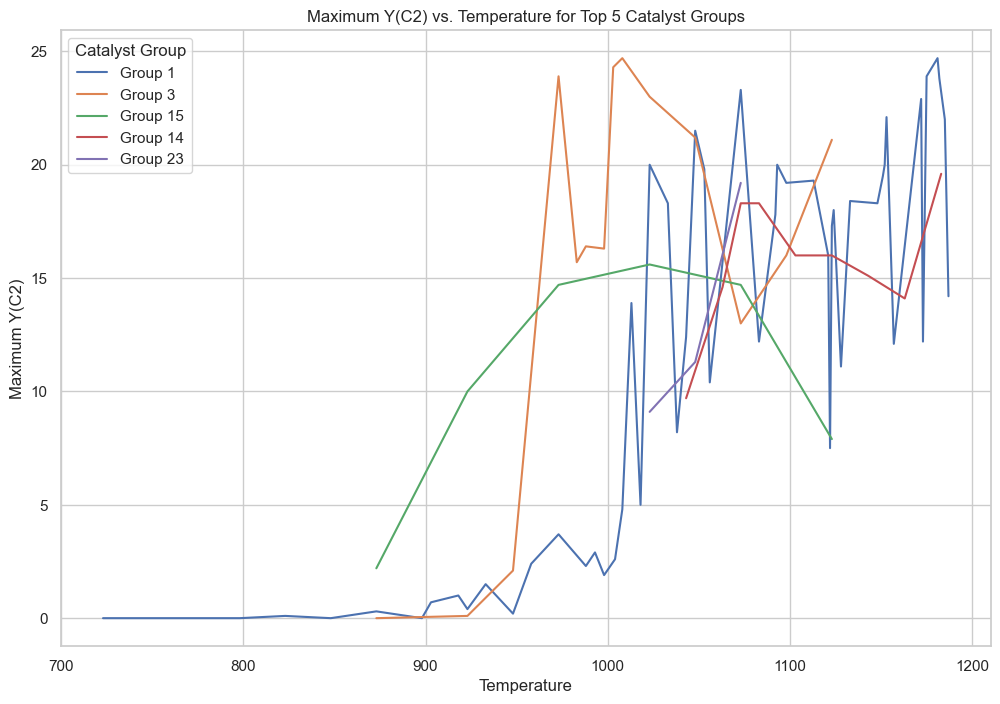

In [36]:
operation_data['group'] = operation_data['group'].replace({2: 1})

# Step 2: Re-evaluate Top Groups
# Find new top 5 groups as merging might have changed the group sizes
grouped = operation_data.groupby('group')
top_5_groups = grouped.size().nlargest(5).index

# Step 3: Find Maximum 'Y(C2)' Again
max_y_c2_per_temp = operation_data[operation_data['group'].isin(top_5_groups)].groupby(['group', 'Temperature'])['Y(C2)'].max().reset_index()

# Step 4: Visualization
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

for group in top_5_groups:
    group_data = max_y_c2_per_temp[max_y_c2_per_temp['group'] == group]
    plt.plot(group_data['Temperature'], group_data['Y(C2)'], label=f'Group {group}')

plt.title('Maximum Y(C2) vs. Temperature for Top 5 Catalyst Groups')
plt.xlabel('Temperature')
plt.ylabel('Maximum Y(C2)')
plt.legend(title='Catalyst Group')
plt.show()

In [37]:
import plotly.graph_objects as go

fig = go.Figure()

for group in top_5_groups:
    group_data = max_y_c2_per_temp[max_y_c2_per_temp['group'] == group]
    comp_data = operation_data[operation_data['group'] == group].iloc[0]
    comp_details = f"Na:{comp_data['Na_C_mol%']}%, W:{comp_data['W_C_mol%']}%, Mn:{comp_data['Mn_C_mol%']}%, Si:{comp_data['Si_S_mol%']}%"
    
    fig.add_trace(go.Scatter(x=group_data['Temperature'], y=group_data['Y(C2)'],
                             mode='lines+markers',
                             name=f'Group {group}',
                             hovertext=comp_details))

fig.update_layout(title='Maximum Y(C2) vs. Temperature for Top 5 Catalyst Groups',
                  xaxis_title='Temperature',
                  yaxis_title='Maximum Y(C2)')

fig.show()

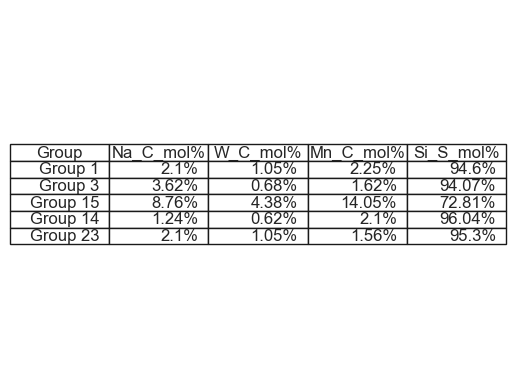

In [38]:
fig, ax = plt.subplots()
ax.axis('tight')
ax.axis('off')
comp_data = []

for group in top_5_groups:
    # Get one example row for each group
    example_row = operation_data[operation_data['group'] == group].iloc[0]
    comp_data.append([f"Group {group}",
                      f"{example_row['Na_C_mol%']}%",
                      f"{example_row['W_C_mol%']}%",
                      f"{example_row['Mn_C_mol%']}%",
                      f"{example_row['Si_S_mol%']}%"])

comp_table = ax.table(cellText=comp_data, colLabels=["Group", "Na_C_mol%", "W_C_mol%", "Mn_C_mol%", "Si_S_mol%"], loc='center')
comp_table.auto_set_font_size(False)
comp_table.set_fontsize(12)

plt.show()

In [39]:
# Specify the top groups including the merged one
top_groups = [1, 3, 15, 14, 23]

# Step 3: Create a DataFrame for top groups
top_groups_data = operation_data[operation_data['group'].isin(top_groups)]

# Step 4: Unify the Catalyst Composition for the merged group
# Assuming using the first entry as the representative value
for col in ['Na_C_mol%', 'W_C_mol%', 'Mn_C_mol%', 'Si_S_mol%']:
    representative_value = top_groups_data[top_groups_data['group'] == 1][col].iloc[0]
    top_groups_data.loc[top_groups_data['group'] == 1, col] = representative_value

# The top_groups_data DataFrame now contains only the data for the top groups with unified compositions for the merged group

In [40]:
top_groups_data

,Na_C_mol%,Mn_C_mol%,W_C_mol%,Si_S_mol%,Preparation,Temperature,p(CH4)/p(O2),p total,Contact time,Y(C2),group
8,2.1,2.25,1.05,94.6,1.0,1092.0,2.1,1.0,0.15,17.8,1
9,2.1,2.25,1.05,94.6,1.0,1124.0,2.2,1.0,0.15,18.0,1
10,2.1,2.25,1.05,94.6,1.0,1175.0,2.0,1.0,0.15,23.9,1
11,2.1,2.25,1.05,94.6,1.0,1123.0,2.7,1.0,0.15,17.0,1
12,2.1,2.25,1.05,94.6,1.0,1151.0,2.7,1.0,0.15,19.5,1
...,...,...,...,...,...,...,...,...,...,...,...
317,2.1,1.56,1.05,95.3,1.0,1073.0,9.0,1.0,0.01,8.5,23
318,2.1,1.56,1.05,95.3,1.0,1073.0,12.0,1.0,0.01,8.3,23
319,2.1,1.56,1.05,95.3,1.0,1073.0,15.0,1.0,0.01,6.5,23
320,2.1,1.56,1.05,95.3,1.0,1073.0,18.0,1.0,0.01,5.6,23


In [41]:
top_groups_data.to_csv(r'C:\Users\OJH\OneDrive\SKKU\연구자료\Catalyst AI\New Database\Na_W_Mn_Cat_preprocess_top5.csv', index=False)